In [24]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import time
import warnings 
warnings.filterwarnings('ignore')

In [25]:
df = pd.read_csv('data/mnist_train.csv')

In [26]:
from yreport import data_health_report

In [27]:
summ = data_health_report(df)

In [17]:
# summ.summary()

In [28]:
df.shape

(60000, 785)

In [29]:
df.sample()

,label,1x1,1x2,1x3,1x4,1x5,1x6,1x7,1x8,1x9,...,28x19,28x20,28x21,28x22,28x23,28x24,28x25,28x26,28x27,28x28
31853,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [20]:
# train_test_split
X_train,X_test,y_train,y_test = train_test_split(df.iloc[:,1:],df.iloc[:,0],test_size = 0.2,random_state=42)

In [21]:
# lets check before pca
knn = KNeighborsClassifier()
knn.fit(X_train,y_train)

import time
start = time.time()
y_pred = knn.predict(X_test)
print('Time taken : ',time.time() - start)

print('Accuracy_score = ',accuracy_score(y_test,y_pred))

Time taken :  33.60761475563049
Accuracy_score =  0.9715


In [22]:
# after pca 
df = pd.read_csv('data/mnist_train.csv')

type(df)

X_train,X_test,y_train,y_test = train_test_split(df.iloc[:,1:],df.iloc[:,0],test_size = 0.2,random_state=42)

# first step standrdize
sd = StandardScaler()

X_train = sd.fit_transform(X_train)
X_test = sd.transform(X_test)

# then apply pca
pca = PCA(n_components = 100)

X_train_tr = pca.fit_transform(X_train)
X_test_tr = pca.transform(X_test)

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_tr,y_train)


start = time.time()
y_pred = knn.predict(X_test_tr)
print('Time taken : ',time.time() - start)

print('Accuracy_score = ',accuracy_score(y_test,y_pred))

Time taken :  1.0418286323547363
Accuracy_score =  0.9605833333333333


In [23]:
# check in loop for pca component
# after pca 
df = pd.read_csv('data/mnist_train.csv')

for i in range(1,786):
    X_train,X_test,y_train,y_test = train_test_split(df.iloc[:,1:],df.iloc[:,0],test_size = 0.2,random_state=42)
    
    # first step standrdize
    sd = StandardScaler()
    
    X_train = sd.fit_transform(X_train)
    X_test = sd.transform(X_test)
    
    # then apply pca
    pca = PCA(n_components = i)
    
    X_train_tr = pca.fit_transform(X_train)
    X_test_tr = pca.transform(X_test)
    
    knn = KNeighborsClassifier(n_neighbors=5)
    knn.fit(X_train_tr,y_train)
    
    
  #  start = time.time()
    y_pred = knn.predict(X_test_tr)
   # print(f'Time taken for {i} pca ',time.time() - start)
    
    print(f'Accuracy_score_for_{i}_component = ',accuracy_score(y_test,y_pred))

Accuracy_score_for_1_component =  0.26108333333333333
Accuracy_score_for_2_component =  0.3164166666666667
Accuracy_score_for_3_component =  0.5073333333333333
Accuracy_score_for_4_component =  0.6639166666666667
Accuracy_score_for_5_component =  0.7405
Accuracy_score_for_6_component =  0.8260833333333333
Accuracy_score_for_7_component =  0.8373333333333334
Accuracy_score_for_8_component =  0.87225
Accuracy_score_for_9_component =  0.8848333333333334
Accuracy_score_for_10_component =  0.9084166666666667
Accuracy_score_for_11_component =  0.9163333333333333
Accuracy_score_for_12_component =  0.91975
Accuracy_score_for_13_component =  0.9285
Accuracy_score_for_14_component =  0.9351666666666667
Accuracy_score_for_15_component =  0.9403333333333334
Accuracy_score_for_16_component =  0.9418333333333333
Accuracy_score_for_17_component =  0.94325
Accuracy_score_for_18_component =  0.9443333333333334
Accuracy_score_for_19_component =  0.9475
Accuracy_score_for_20_component =  0.9495
Accuracy_

KeyboardInterrupt: 

In [30]:
import plotly.express as px

In [31]:
# lets see visulazation for 2d
# after pca 
df = pd.read_csv('data/mnist_train.csv')

type(df)

X_train,X_test,y_train,y_test = train_test_split(df.iloc[:,1:],df.iloc[:,0],test_size = 0.2,random_state=42)

# first step standrdize
sd = StandardScaler()

X_train = sd.fit_transform(X_train)
X_test = sd.transform(X_test)

# then apply pca
pca = PCA(n_components = 2)

X_train_tr = pca.fit_transform(X_train)
X_test_tr = pca.transform(X_test)

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_tr,y_train)


start = time.time()
y_pred = knn.predict(X_test_tr)
print('Time taken : ',time.time() - start)

print('Accuracy_score = ',accuracy_score(y_test,y_pred))

Time taken :  0.8117022514343262
Accuracy_score =  0.31666666666666665


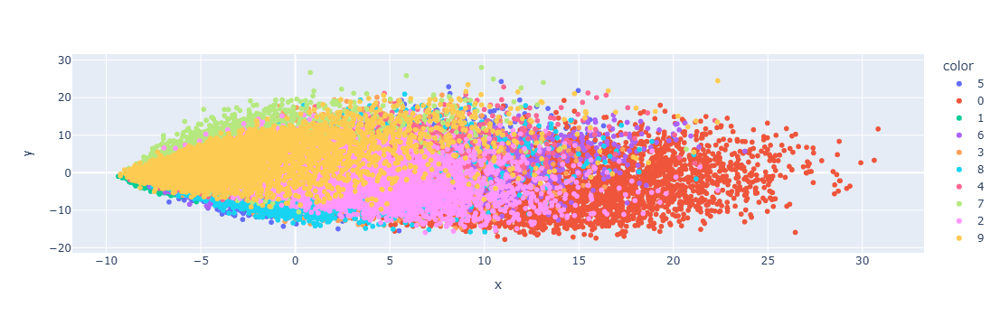

In [38]:
y_train_tr = y_train.astype('str')
px.scatter(x=X_train_tr[:,0],y= X_train_tr[:,1],color=y_train_tr)

In [39]:
# for 3 d
# lets see visulazation for 2d
# after pca 
df = pd.read_csv('data/mnist_train.csv')

type(df)

X_train,X_test,y_train,y_test = train_test_split(df.iloc[:,1:],df.iloc[:,0],test_size = 0.2,random_state=42)

# first step standrdize
sd = StandardScaler()

X_train = sd.fit_transform(X_train)
X_test = sd.transform(X_test)

# then apply pca
pca = PCA(n_components = 3)

X_train_tr = pca.fit_transform(X_train)
X_test_tr = pca.transform(X_test)

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_tr,y_train)


start = time.time()
y_pred = knn.predict(X_test_tr)
print('Time taken : ',time.time() - start)

print('Accuracy_score = ',accuracy_score(y_test,y_pred))

Time taken :  0.46141958236694336
Accuracy_score =  0.5074166666666666


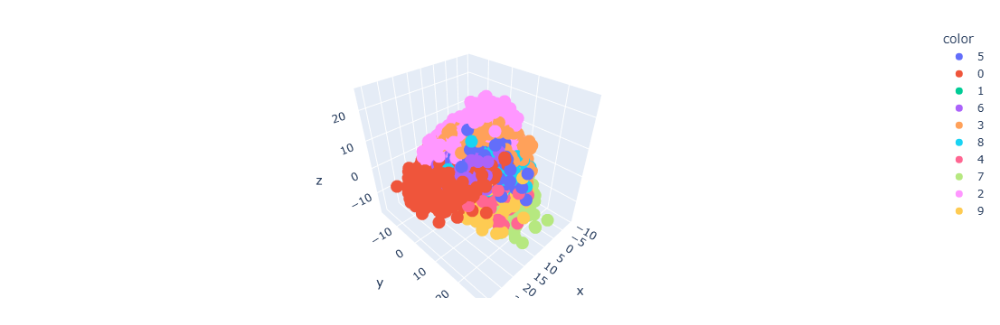

In [45]:
fig = px.scatter_3d(x=X_train_tr[:,0],y= X_train_tr[:,1], z = X_train_tr[:,2],color=y_train_tr)
fig.update_layout(margin = dict(l = 30 , r = 30 , b= 30 , t = 30))

In [46]:
pca.components_

array([[-2.29939154e-17,  7.59324591e-18,  1.16955295e-20, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 9.19131199e-17, -3.01469506e-17,  2.13622986e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 2.08870043e-16, -7.06019552e-17, -1.51998626e-18, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [48]:
pca.explained_variance_
# eigen values

array([40.65780534, 29.35286727, 26.72542322])

In [55]:
pca.explained_variance_ratio_ * 100
# how much percentage each component contribute 

array([5.70223819, 4.11672591, 3.74822811])

In [59]:
pca = PCA(n_components = None)
X_train_tr = pca.fit_transform(X_train)

In [62]:
pca.explained_variance_ratio_.shape
# there are 784 eigen vectors

(784,)

In [65]:
np.cumsum(pca.explained_variance_ratio_)
# by this we can see how much percentage still that componets is

array([0.05702238, 0.09818964, 0.13567192, 0.16469803, 0.18997512,
       0.21201816, 0.23145483, 0.24899896, 0.26449107, 0.27857721,
       0.29203612, 0.30418912, 0.31541422, 0.32643714, 0.33677905,
       0.34679973, 0.35628657, 0.36553212, 0.37450139, 0.3832566 ,
       0.39165487, 0.39977906, 0.40746453, 0.41493226, 0.42213525,
       0.42907204, 0.43594926, 0.44259091, 0.44892842, 0.45509787,
       0.46114434, 0.46706145, 0.47279214, 0.47848895, 0.48409704,
       0.48949156, 0.4948431 , 0.50008162, 0.50521951, 0.51006006,
       0.51486238, 0.51961237, 0.52422734, 0.52876164, 0.5332432 ,
       0.53769768, 0.54208869, 0.54644584, 0.55075226, 0.55491002,
       0.55903357, 0.56310875, 0.56711141, 0.57106149, 0.57495932,
       0.57881571, 0.58255742, 0.58627309, 0.58991977, 0.59351945,
       0.59709068, 0.60059041, 0.60404334, 0.60748518, 0.61090121,
       0.61426725, 0.61761329, 0.62090554, 0.62413045, 0.62730982,
       0.63046295, 0.63359184, 0.63668903, 0.6397278 , 0.64275

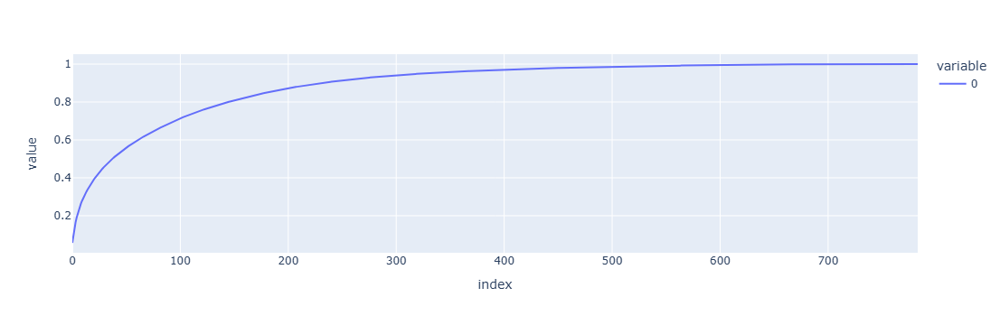

In [71]:
px.line(np.cumsum(pca.explained_variance_ratio_))

In [72]:
# by this graph we can see how many componets needs to obtain our accuracy